In [1]:
push!(LOAD_PATH, pwd());
using SelfDrivingFilters
using Distributions
using VariableTransforms
using Gadfly
using DataFrames
using Optim
using Statistics: mean, var
include("helper_functions.jl")

┌ Info: Precompiling SelfDrivingFilters [35c71cb5-faf7-4b54-8da6-450bf80f40cf]
└ @ Base loading.jl:1278


plot_models (generic function with 2 methods)

# Criterion setup 

In [2]:
function ll_N(parameters, data_t)
#     σ=from_R_to_pos(parameters[1]);
#     μ=parameters[2]
#     yt=data_t[1]
#     d=Normal(μ, σ)
#     -logpdf(d, yt)
    -logpdf(Normal(parameters[2], from_R_to_pos(parameters[1])), data_t[1])
end

ll_N (generic function with 1 method)

In [3]:
struct GARCH_results
    paths::Array{Number,2}
end
function garch_criterion(parameters::AbstractArray{S,1}, data) where {S<:Number}
    μ,ω,A,B=parameters
    A=from_R_to_pos(A)
    B=from_R_to_11(B)
    ll=zero(S)
    fts=Array{S,2}(undef,2,length(data)+1)
    fts[1,1]=var(data)
    fts[2,:].=μ
    try
        for i=1:length(data)
            ll+=logpdf(Normal(μ, sqrt(fts[1,i])), data[i])
            fts[1,i+1:i+1].=ω+B*(fts[1,i]-ω)+A*(data[i]^2-fts[1,i])
        end
        return ll/length(data), fts
    catch
        return -Inf, []
    end
end

garch_criterion (generic function with 1 method)

# Simulated data 

## Time-varying volatility

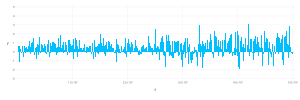

In [4]:
T=5000
μ=fill(0.5,T)
σ=structural_breaks(T,[0.5,1.0],[1,1])
d=[rand(Normal(i,j)) for (i,j) in zip(μ,σ)];
true_paths=[σ μ]'
draw(SVG(30cm,10cm),plot(x=1:T,y=d,Geom.bar,Coord.Cartesian(xmin=1,xmax=T)))

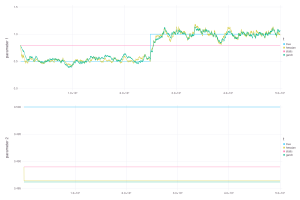

In [5]:
#Self-driving
tv_ix=[true;false]
model=define_model(
    tv_ix,
    ll_N;
    parameter_transforms=(
        (1, from_R_to_pos, from_pos_to_R),
    ),
    filter_type=:sparse,
    scaling_options=(:hessian, 0.99),
    init_options=:static,
)
add_data!(model, d)
ω = [from_pos_to_R(std(d));mean(d)]
fit!(model, ω; As=[0.01;0.1], Bs=[0.99;0.999]);

#GARCH(1,1)
garch_initial_parameters=[mean(d);var(d);from_pos_to_R(0.01);from_11_to_R(0.99)]
criterion=x-> -garch_criterion(x, d)[1]
r=Optim.optimize(criterion, garch_initial_parameters, Optim.NelderMead())
r=Optim.optimize(criterion, r.minimizer, Optim.BFGS())
fts=garch_criterion(r.minimizer, d)[2]
fts[1,:].=sqrt.(fts[1,:])


plot_models(true_paths, Dict(
    :static=>model.results.static,
    :hessian=>model.results.best,
    :garch=>GARCH_results(fts)
))

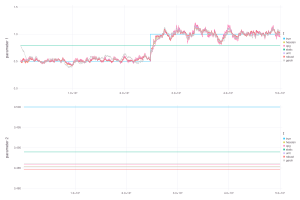

In [6]:
models=Dict{Any,Any}()

#GARCH(1,1)
garch_initial_parameters=[mean(d);var(d);from_pos_to_R(0.01);from_11_to_R(0.99)]
criterion=x-> -garch_criterion(x, d)[1]
r=Optim.optimize(criterion, garch_initial_parameters, Optim.NelderMead())
r=Optim.optimize(criterion, r.minimizer, Optim.BFGS())
fts=garch_criterion(r.minimizer, d)[2]
fts[1,:].=sqrt.(fts[1,:])
models[:garch]=GARCH_results(fts)

#Self-driving
for scaling_options in (
        (:hessian, 0.99),
        (:robust, 0.99),
        (:opg, 0.99),
        (:unit,),
    )
    tv_ix=[true;false]
    model=define_model(
        tv_ix,
        ll_N;
        parameter_transforms=(
            (1, from_R_to_pos, from_pos_to_R),
        ),
        filter_type=:sparse,
        scaling_options=scaling_options,
        init_options=(:reverse_run, 0.5),
    )
    add_data!(model, d)
    fit!(model, [1.0;1.0]; As=[0.01;0.1], Bs=[0.99;0.999]);
    models[:static]=model.results.static
    models[scaling_options[1]]=model.results.best
end
plot_models(true_paths, models)

## Time-varying volatility and mean 

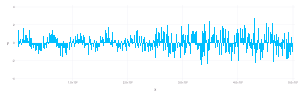

In [7]:
T=5000
μ=sinusoid(T,0.5,10)
σ=structural_breaks(T,[0.5,1.0],[1,1])
d=[rand(Normal(i,j)) for (i,j) in zip(μ,σ)];
true_paths=[σ μ]'
draw(SVG(30cm,10cm),plot(x=1:T,y=d,Geom.bar,Coord.Cartesian(xmin=1,xmax=T)))

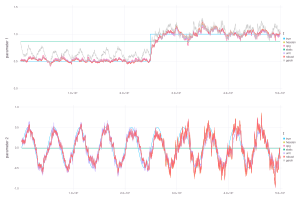

In [8]:
models=Dict{Any,Any}()

#GARCH(1,1)
garch_initial_parameters=[mean(d);var(d);from_pos_to_R(0.01);from_11_to_R(0.99)]
criterion=x-> -garch_criterion(x, d)[1]
r=Optim.optimize(criterion, garch_initial_parameters, Optim.NelderMead())
r=Optim.optimize(criterion, r.minimizer, Optim.BFGS())
fts=garch_criterion(r.minimizer, d)[2]
fts[1,:].=sqrt.(fts[1,:])
models[:garch]=GARCH_results(fts)

#Self-driving
for scaling_options in (
        (:hessian, 0.99),
        (:robust, 0.99),
        (:opg, 0.99),
        (:unit,),
    )
    tv_ix=[true;true]
    model=define_model(
        tv_ix,
        ll_N;
        parameter_transforms=(
            (1, from_R_to_pos, from_pos_to_R),
        ),
        filter_type=:sparse,
        scaling_options=scaling_options,
        init_options=(:reverse_run, 0.5),
    )
    add_data!(model, d)
    fit!(model, [1.0;1.0]; As=[0.01;0.1], Bs=[0.99;0.999]);
    models[:static]=model.results.static
    models[scaling_options[1]]=model.results.best
end
plot_models(true_paths, models)

# S&P500 

In [9]:
using CSV
df=open("market_data.csv","r") do f
    CSV.read(f, DataFrame)
end
d=df[:,:SP500]
first(df,5)

,Date,DAX,SP500
,Date…,Float64,Float64
1,1990-01-03,3.00128,-0.258891
2,1990-01-04,-1.82327,-0.865031
3,1990-01-05,-0.868743,-0.980414
4,1990-01-08,1.2683,0.450432
5,1990-01-09,1.22455,-1.18567


## Time-varying volatility 

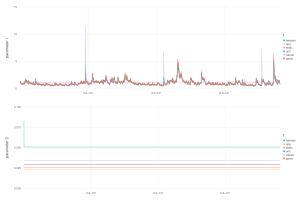

In [11]:
models=Dict{Any,Any}()

#GARCH(1,1)
garch_initial_parameters=[mean(d);var(d);from_pos_to_R(0.01);from_11_to_R(0.99)]
criterion=x-> -garch_criterion(x, d)[1]
r=Optim.optimize(criterion, garch_initial_parameters, Optim.NelderMead())
r=Optim.optimize(criterion, r.minimizer, Optim.BFGS())
fts=garch_criterion(r.minimizer, d)[2]
fts[1,:].=sqrt.(fts[1,:])
models[:garch]=GARCH_results(fts)

#Self-driving
for scaling_options in (
        (:hessian, 0.99),
        (:robust, 0.99),
        (:opg, 0.99),
        (:unit,),
    )
    tv_ix=[true;false]
    model=define_model(
        tv_ix,
        ll_N;
        parameter_transforms=(
            (1, from_R_to_pos, from_pos_to_R),
        ),
        filter_type=:sparse,
        scaling_options=scaling_options,
        init_options=(:reverse_run, 0.5),
    )
    add_data!(model, d)
    fit!(model, [1.0;1.0]; As=[0.01;0.1], Bs=[0.99;0.999]);
    models[:static]=model.results.static
    models[scaling_options[1]]=model.results.best
end
plot_models(models)

## Time-varying volatility and mean

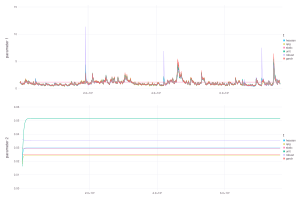

In [12]:
models=Dict{Any,Any}()

#GARCH(1,1)
garch_initial_parameters=[mean(d);var(d);from_pos_to_R(0.01);from_11_to_R(0.99)]
criterion=x-> -garch_criterion(x, d)[1]
r=Optim.optimize(criterion, garch_initial_parameters, Optim.NelderMead())
r=Optim.optimize(criterion, r.minimizer, Optim.BFGS())
fts=garch_criterion(r.minimizer, d)[2]
fts[1,:].=sqrt.(fts[1,:])
models[:garch]=GARCH_results(fts)

#Self-driving
for scaling_options in (
        (:hessian, 0.99),
        (:robust, 0.99),
        (:opg, 0.99),
        (:unit,),
    )
    tv_ix=[true;true]
    model=define_model(
        tv_ix,
        ll_N;
        parameter_transforms=(
            (1, from_R_to_pos, from_pos_to_R),
        ),
        filter_type=:sparse,
        scaling_options=scaling_options,
        init_options=(:reverse_run, 0.5),
    )
    add_data!(model, d)
    fit!(model, [1.0;1.0]; As=[0.01;0.1], Bs=[0.99;0.999]);
    models[:static]=model.results.static
    models[scaling_options[1]]=model.results.best
end
plot_models(models)